# Análise de vinho

O objetivo do projeto é avaliação da qualidade do vinho por meio de técnicas de mineração de dados, oferecendo suporte tanto para a produção quanto para a comercialização. 
Identificando os fatores físico-químicos e sensoriais mais relevantes que influenciam a qualidade do vinho. Com esses insights, é possível otimizar o processo de fabricação e também identificar vinhos premium, permitindo ajustes na precificação.



### **Contexto do Estudo**

O estudo concentra-se na produção de _Vinho Verde_, um segmento que corresponde a aproximadamente 15% da produção de vinhos portugueses. São analisadas as duas variantes mais comuns: vinho branco e vinho tinto. Os dados foram coletados entre maio de 2004 e fevereiro de 2007, tendo sido testados e certificados pela CVRVV.

## Objetivos do projeto 


Para o projeto devem ser empregadas as seguintes técnicas:

- Análise exploratória de dados;
- Pré-Processamento dos dados;
- técnicas clássicas de filtragem; e
- balanceamento de classes.

Vale ressaltar que este é um problema de predição, pois o objetivo do artigo é prever a nota (0 a 10), mesmo que pareça um problema de classificação.

In [2]:
# imports

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import streamlit as st

# import sklearn

## Adquirindo a base de dados

In [3]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
wine_quality = fetch_ucirepo(id=186) 
  
# data (as pandas dataframes) 
X = wine_quality.data.features 
y = wine_quality.data.targets 
  
# metadata 
print(wine_quality.metadata) 
  
# variable information 
print(wine_quality.variables)

{'uci_id': 186, 'name': 'Wine Quality', 'repository_url': 'https://archive.ics.uci.edu/dataset/186/wine+quality', 'data_url': 'https://archive.ics.uci.edu/static/public/186/data.csv', 'abstract': 'Two datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests (see [Cortez et al., 2009], http://www3.dsi.uminho.pt/pcortez/wine/).', 'area': 'Business', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 4898, 'num_features': 11, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['quality'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Wed Nov 15 2023', 'dataset_doi': '10.24432/C56S3T', 'creators': ['Paulo Cortez', 'A. Cerdeira', 'F. Almeida', 'T. Matos', 'J. Reis'], 'intro_paper': {'ID': 252, 'type': 'NATIVE', 'title': 'Modeling wine preferences

In [4]:
Z = wine_quality.data.original

In [5]:
Z.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color'],
      dtype='object')

In [6]:
Z.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [7]:
Z.shape

(6497, 13)

In [8]:
X.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [9]:
X.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000


In [10]:
X[X.isna().any(axis=1)]

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol


In [11]:
X.empty

False

In [12]:
X.shape

(6497, 11)

In [13]:
X.ndim

2

In [14]:
X.dtypes

fixed_acidity           float64
volatile_acidity        float64
citric_acid             float64
residual_sugar          float64
chlorides               float64
free_sulfur_dioxide     float64
total_sulfur_dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
dtype: object

In [15]:
X.info

<bound method DataFrame.info of       fixed_acidity  volatile_acidity  citric_acid  ...    pH  sulphates  alcohol
0               7.4              0.70         0.00  ...  3.51       0.56      9.4
1               7.8              0.88         0.00  ...  3.20       0.68      9.8
2               7.8              0.76         0.04  ...  3.26       0.65      9.8
3              11.2              0.28         0.56  ...  3.16       0.58      9.8
4               7.4              0.70         0.00  ...  3.51       0.56      9.4
...             ...               ...          ...  ...   ...        ...      ...
6492            6.2              0.21         0.29  ...  3.27       0.50     11.2
6493            6.6              0.32         0.36  ...  3.15       0.46      9.6
6494            6.5              0.24         0.19  ...  2.99       0.46      9.4
6495            5.5              0.29         0.30  ...  3.34       0.38     12.8
6496            6.0              0.21         0.38  ...  3.26     

In [16]:
X.value_counts()

fixed_acidity  volatile_acidity  citric_acid  residual_sugar  chlorides  free_sulfur_dioxide  total_sulfur_dioxide  density  pH    sulphates  alcohol
7.0            0.150             0.28         14.7            0.051      29.0                 149.0                 0.99792  2.96  0.39       9.0        8
7.3            0.190             0.27         13.9            0.057      45.0                 155.0                 0.99807  2.94  0.41       8.8        8
6.8            0.180             0.30         12.8            0.062      19.0                 171.0                 0.99808  3.00  0.52       9.0        7
7.4            0.160             0.30         13.7            0.056      33.0                 168.0                 0.99825  2.90  0.44       8.7        7
                                 0.27         15.5            0.050      25.0                 135.0                 0.99840  2.90  0.43       8.7        6
                                                                           

In [17]:
y.head()

,quality
0,5
1,5
2,5
3,6
4,5


In [18]:
y.value_counts()

quality
6          2836
5          2138
7          1079
4           216
8           193
3            30
9             5
Name: count, dtype: int64

In [19]:
y.describe()

,quality
count,6497.000000
mean,5.818378
std,0.873255
min,3.000000
25%,5.000000
50%,6.000000
75%,6.000000
max,9.000000


In [20]:
y[y.isna().any(axis=1)]

,quality


In [21]:
y.empty

False

In [22]:
y.shape

(6497, 1)

In [23]:
y.ndim

2

In [24]:
y.dtypes

quality    int64
dtype: object

X =  11 Características do vinho 
y = as notas vão de 3 a 9

- `count` : todas as características contem o mesmo numero de amostras, logo não precisamos balancear o conjunto de dados
- `std` : O desvio padrão com valores abaixo da media de valores em todas as características indica que o conjunto de dados esta distribuído próximo a media dos valores.
- `value_count`s quando ao conjunto de dados y (target ) -  apresenta que os dados estão pouco estratificados, mesmo que o desvio padrão indique um distribuição normal dos dados é possível observar que existem poucos dados em avaliações <5 e >7 o que pode fazer como que o modelos não tenha uma boa precisão indicar vinhos com máxima e mínima avaliação.
- `max` : em muitos casos o valor máximo esta distante a media de 75% do conjunto dos dados o que pode indicar que existam vinhos com ingredientes fora dos padrões de produção, cabe verificar se esses valores tem alguma correlação com a nota de qualidade
- `shape` : 6497,11 e 6497, 1
- `ndim` : 2 D
- `dtypes`: todos os valores são `float64`
- `isna` : não existem valores `nan`
- `empty`: não existem colunas vazias

## Análise visual dos dados

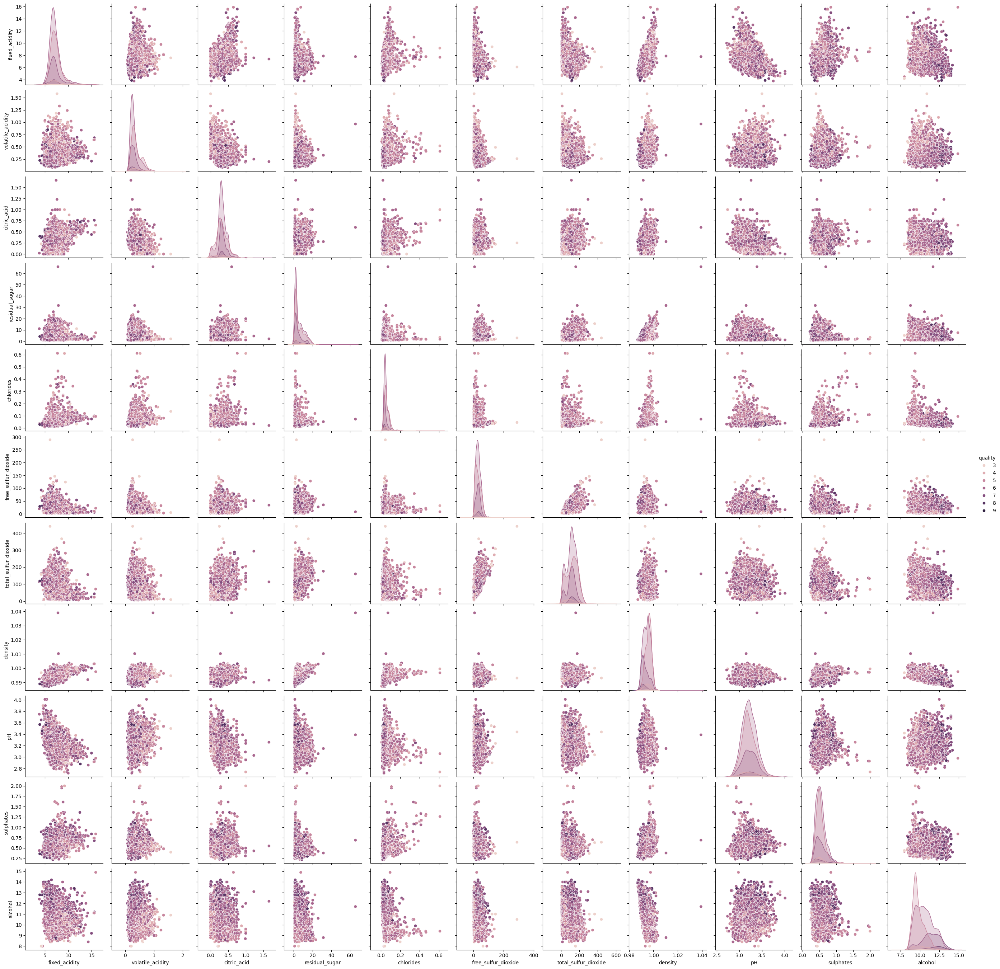

In [25]:
sns.pairplot(Z.iloc[:, :-1], hue="quality")

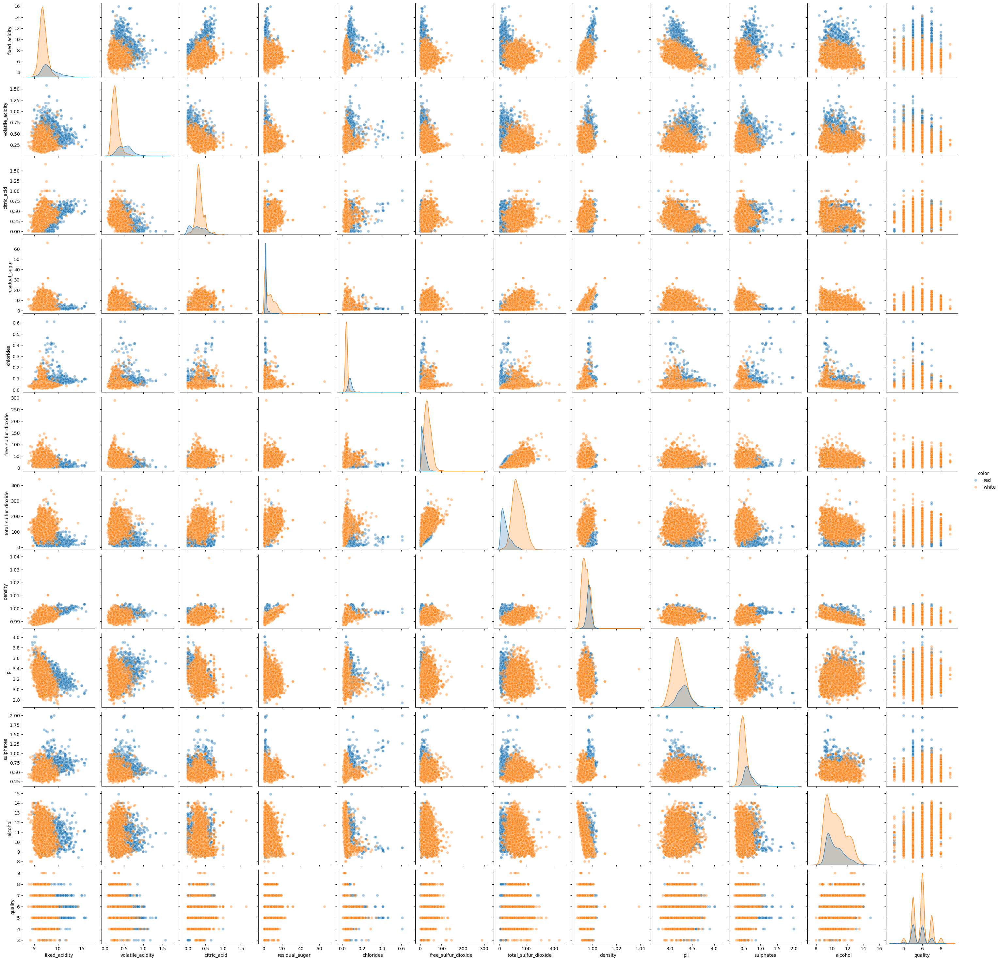

In [26]:
sns.pairplot(Z, hue="color", plot_kws={'alpha': 0.4} )

<Axes: >

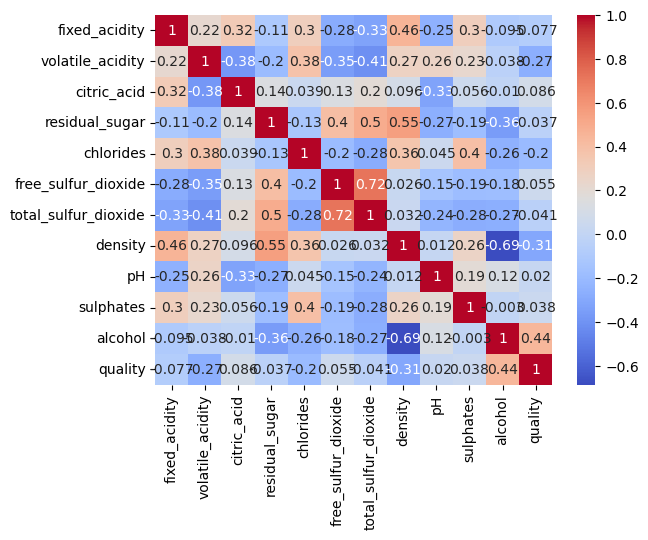

In [27]:
sns.heatmap(Z.iloc[:, :-1].corr(), cmap='coolwarm', annot=True)

In [28]:
W = Z.copy()

W["color"] = W["color"].map({"red": 0, "white": 1})


<Axes: >

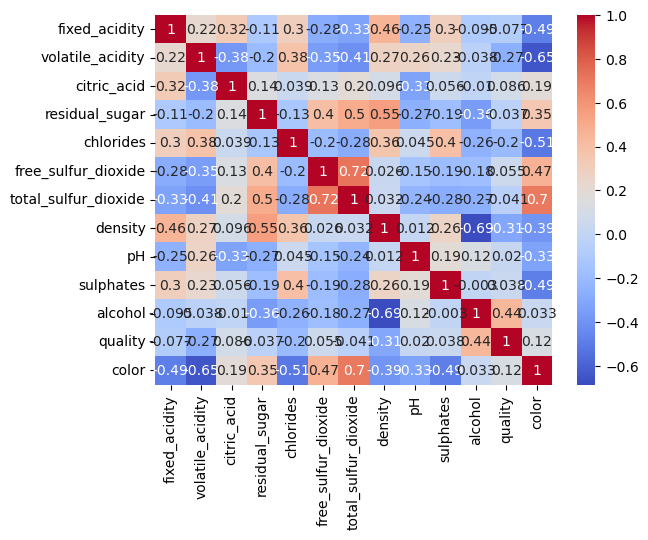

In [29]:
sns.heatmap(W.corr(), cmap='coolwarm', annot=True)

In [30]:
corr_color = W.corr()
corr_color["color"]

fixed_acidity          -0.486740
volatile_acidity       -0.653036
citric_acid             0.187397
residual_sugar          0.348821
chlorides              -0.512678
free_sulfur_dioxide     0.471644
total_sulfur_dioxide    0.700357
density                -0.390645
pH                     -0.329129
sulphates              -0.487218
alcohol                 0.032970
quality                 0.119323
color                   1.000000
Name: color, dtype: float64

<Axes: >

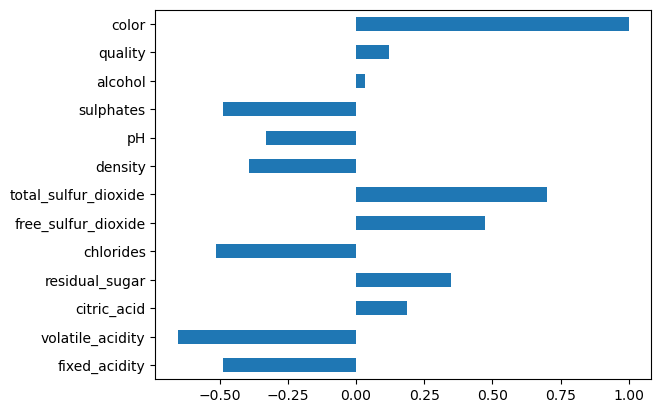

In [31]:
corr_color["color"].plot(kind="barh")

In [32]:
corr_abs = corr_color["color"].abs()
corr_sort = corr_abs.sort_values(ascending=True)

<Axes: >

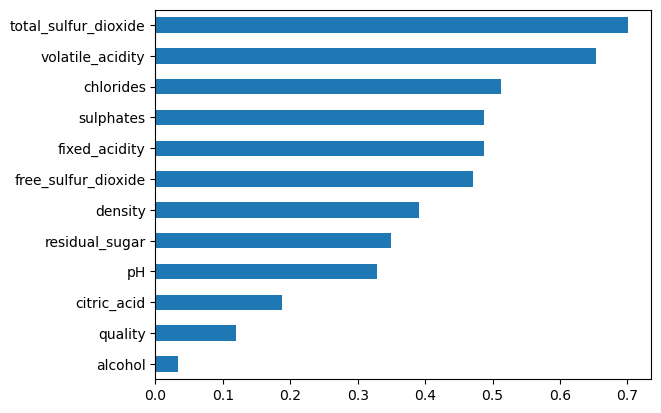

In [33]:
corr_sort.iloc[:-1].plot(kind="barh")

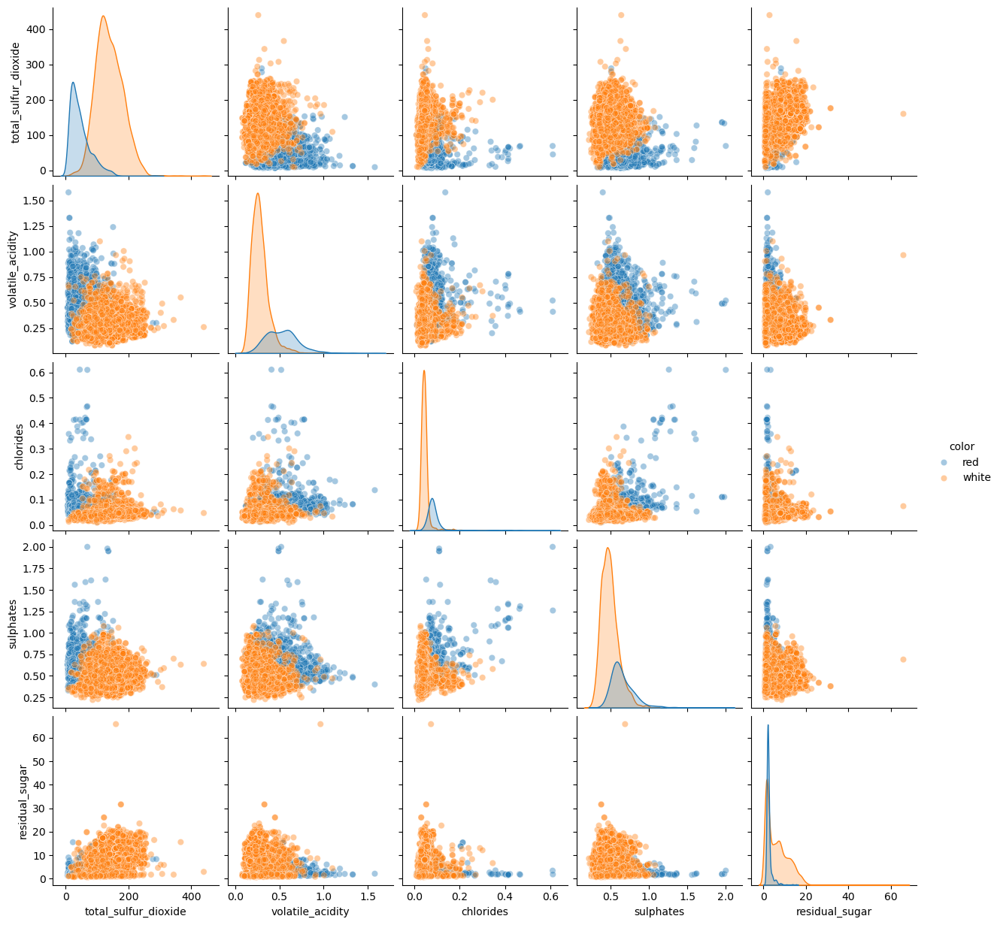

In [34]:

sns.pairplot(Z[["total_sulfur_dioxide", "volatile_acidity", "chlorides", "sulphates", "residual_sugar", "color"]], hue="color", plot_kws={'alpha': 0.4})

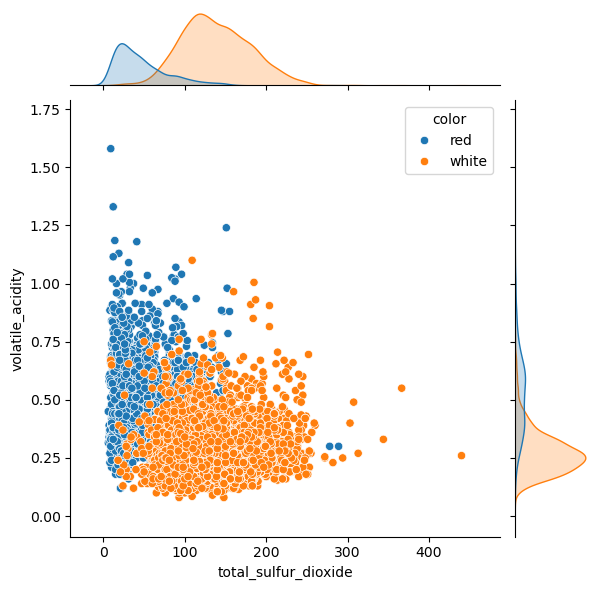

In [35]:
sns.jointplot(data=Z, x='total_sulfur_dioxide', y='volatile_acidity', hue= "color")


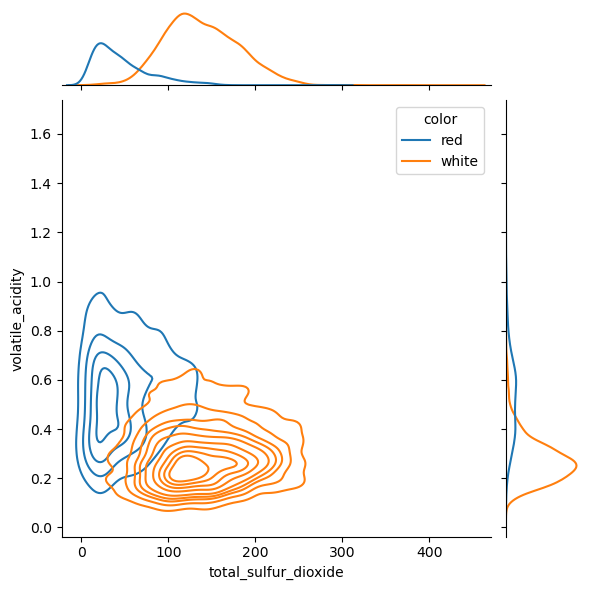

In [36]:
sns.jointplot(data=Z, x='total_sulfur_dioxide', y='volatile_acidity', kind='kde', hue="color")

<Axes: xlabel='total_sulfur_dioxide', ylabel='volatile_acidity'>

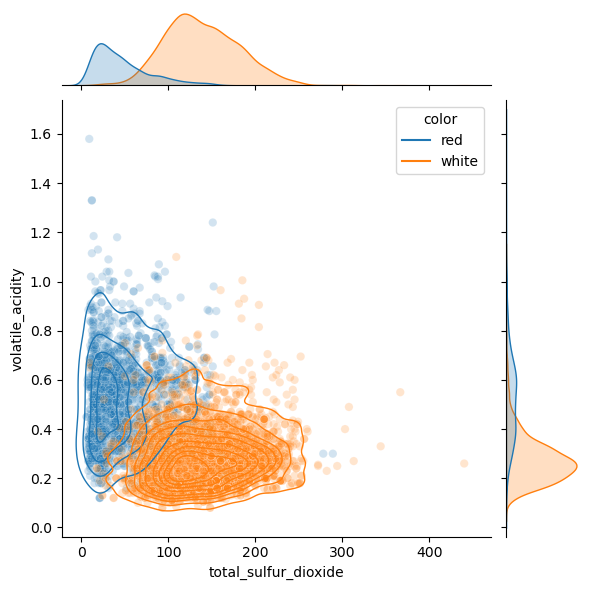

In [37]:
# Cria o jointplot com scatter e hue para os pontos
g = sns.jointplot(data=Z, x='total_sulfur_dioxide', y='volatile_acidity',
                  kind='scatter', hue='color', alpha=0.2)

# Sobrepõe o KDE com a mesma diferenciação de cor
sns.kdeplot(data=Z, x='total_sulfur_dioxide', y='volatile_acidity',
            hue='color', ax=g.ax_joint, alpha=1, linewidths=1)

<Axes: xlabel='chlorides', ylabel='sulphates'>

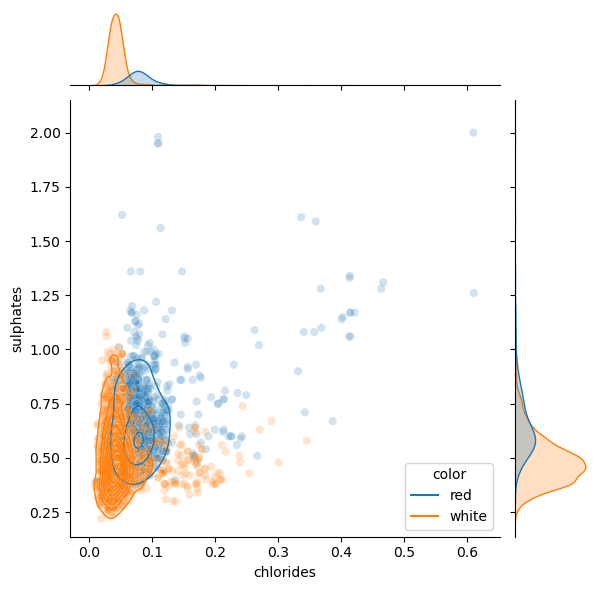

In [38]:
"chlorides", "sulphates",

# Cria o jointplot com scatter e hue para os pontos
g = sns.jointplot(data=Z, x="chlorides", y="sulphates",
                  kind='scatter', hue='color', alpha=0.2)

# Sobrepõe o KDE com a mesma diferenciação de cor
sns.kdeplot(data=Z, x="chlorides", y="sulphates",
            hue='color', ax=g.ax_joint, alpha=1, linewidths=1)

<Axes: xlabel='volatile_acidity', ylabel='sulphates'>

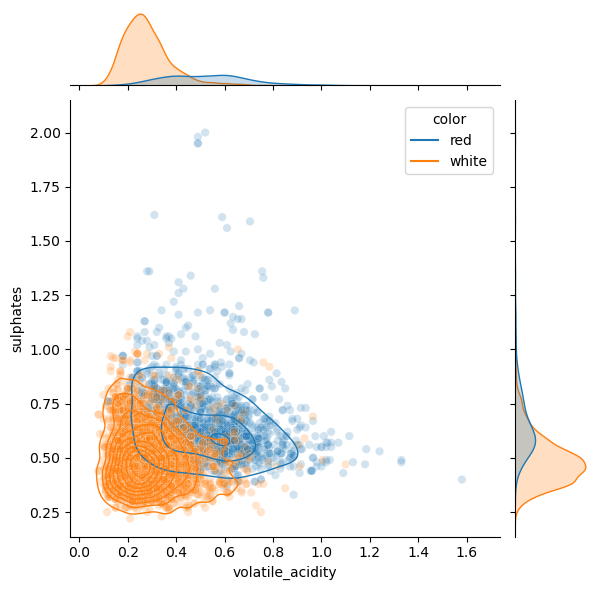

In [39]:
# Cria o jointplot com scatter e hue para os pontos
g = sns.jointplot(data=Z, x='volatile_acidity', y="sulphates",
                  kind='scatter', hue='color', alpha=0.2)

# Sobrepõe o KDE com a mesma diferenciação de cor
sns.kdeplot(data=Z, x='volatile_acidity', y="sulphates",
            hue='color', ax=g.ax_joint, alpha=1, linewidths=1)

<Axes: xlabel='volatile_acidity', ylabel='chlorides'>

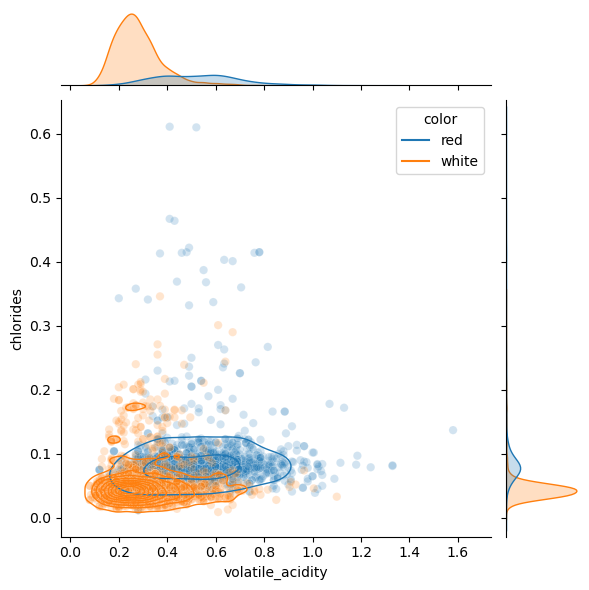

In [40]:
# Cria o jointplot com scatter e hue para os pontos
g = sns.jointplot(data=Z, x='volatile_acidity', y="chlorides",
                  kind='scatter', hue='color', alpha=0.2)

# Sobrepõe o KDE com a mesma diferenciação de cor
sns.kdeplot(data=Z, x='volatile_acidity', y="chlorides",
            hue='color', ax=g.ax_joint, alpha=1, linewidths=1)

<Axes: xlabel='total_sulfur_dioxide', ylabel='volatile_acidity'>

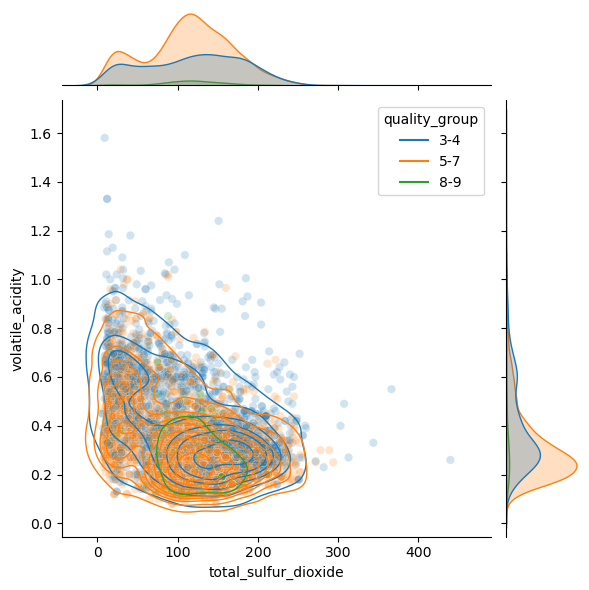

In [41]:
# Define uma função para agrupar a qualidade
def agrupar_quality(q):
    if 3 <= q <= 5:
        return '3-4'
    elif 6 <= q <= 7:
        return '5-7'
    elif 8 <= q <= 9:
        return '8-9'
    else:
        return 'Outros'

# Aplica a função e cria uma nova coluna 'quality_group'
Z['quality_group'] = Z['quality'].apply(agrupar_quality)

# Cria o jointplot com scatter usando a nova coluna para hue
g = sns.jointplot(data=Z, x='total_sulfur_dioxide', y='volatile_acidity',
                  kind='scatter', hue='quality_group', alpha=0.2)

# Sobrepõe o KDE com a mesma diferenciação de cor
sns.kdeplot(data=Z, x='total_sulfur_dioxide', y='volatile_acidity',
            hue='quality_group', ax=g.ax_joint, alpha=1, linewidths=1)

In [42]:
# Vinhos mais bem avaliados: qualidade maior que 7
vinhos_bem = Z[Z["quality"] > 7]

# Vinhos menos avaliados: qualidade menor que 3
vinhos_mal = Z[Z["quality"] <= 3]

In [43]:
# Prevalência da variável "color" para vinhos bem avaliados
prevalencia_bem = vinhos_bem["color"].value_counts(normalize=True)
print("Prevalência em vinhos bem avaliados:\n", prevalencia_bem)

# Prevalência da variável "color" para vinhos mal avaliados
prevalencia_mal = vinhos_mal["color"].value_counts(normalize=True)
print("Prevalência em vinhos mal avaliados:\n", prevalencia_mal)

Prevalência em vinhos bem avaliados:
 color
white    0.909091
red      0.090909
Name: proportion, dtype: float64
Prevalência em vinhos mal avaliados:
 color
white    0.666667
red      0.333333
Name: proportion, dtype: float64


In [44]:
sample_red = Z[Z["color"] == "red"]
sample_white = Z[Z["color"] == "white"]


print(f'''total de amostras:{Z.shape[0]}.\n
      total de amostras vinho tinto: {sample_red.shape[0]}, {round(sample_red.shape[0] * 100/Z.shape[0], 2)}%\n
      total de amostras vinho branco: {sample_white.shape[0]}, {round(sample_white.shape[0] * 100/Z.shape[0], 2)}%''')

total de amostras:6497.

      total de amostras vinho tinto: 1599, 24.61%

      total de amostras vinho branco: 4898, 75.39%


In [45]:
round(sample_red["quality"].value_counts() / sample_red.shape[0], 3)

quality
5    0.426
6    0.399
7    0.124
4    0.033
8    0.011
3    0.006
Name: count, dtype: float64

In [46]:
round(sample_white["quality"].value_counts() / sample_white.shape[0], 3)

quality
6    0.449
5    0.297
7    0.180
8    0.036
4    0.033
3    0.004
9    0.001
Name: count, dtype: float64

In [47]:
(0.449+0.297)* 100

74.6

In [48]:
sample_red.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,quality_group
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,3-4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red,3-4
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red,3-4
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red,5-7
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,3-4


In [49]:
# X_red = sample_red[["total_sulfur_dioxide","volatile_acidity","chlorides"]].values
# y_red = sample_red["quality"].values
# X_red.shape

In [50]:
# X_white = sample_white[["total_sulfur_dioxide","volatile_acidity","chlorides"]].values
# y_white = sample_white["quality"].values
# y_white.shape

In [51]:
X_red = sample_red.iloc[:, :-3].values
y_red = sample_red["quality"].values
X_red.shape

(1599, 11)

In [52]:
X_red = sample_red.iloc[:, :-3].values
y_red = sample_red["quality"].values

X_white = sample_white.iloc[:, :-3].values
y_white = sample_white["quality"].values

In [53]:
from sklearn.model_selection import train_test_split

X_train_full, X_test, y_train_full, y_test = train_test_split(
    X_white, y_white, test_size=0.1, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train_full, y_train_full, test_size=0.1, random_state=42)

# tinto:  X_train, y_train, X_valid, y_valid, X_test, y_test


Xw_train_full, Xw_test, yw_train_full, yw_test = train_test_split(
    X_white, y_white, test_size=0.1, random_state=42)
Xw_train, Xw_valid, yw_train, yw_valid = train_test_split(
    Xw_train_full, yw_train_full, test_size=0.1, random_state=42)

# Branco: Xw_train, yw_train, Xw_valid, y_valid, Xw_test, yw_test

In [54]:
tf.random.set_seed(42)

In [55]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(20, activation="relu"),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(10, activation="relu"),
    tf.keras.layers.Dense(5, activation="relu"),
    tf.keras.layers.Dense(1)
])

In [56]:
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-3)
model.compile(loss="mse", optimizer=optimizer, metrics=["mae"])

In [57]:
history = model.fit(X_train, y_train, epochs=20,
                    validation_data=(X_valid, y_valid))

Epoch 1/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9283 - mae: 2.3725 - val_loss: 2.7239 - val_mae: 1.3371
Epoch 2/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 571us/step - loss: 4.4921 - mae: 1.6750 - val_loss: 2.3479 - val_mae: 1.2254
Epoch 3/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step - loss: 3.6778 - mae: 1.5058 - val_loss: 2.2932 - val_mae: 1.1879
Epoch 4/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 552us/step - loss: 3.8820 - mae: 1.5195 - val_loss: 2.9555 - val_mae: 1.3559
Epoch 5/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 554us/step - loss: 3.4135 - mae: 1.4864 - val_loss: 2.1140 - val_mae: 1.1369
Epoch 6/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step - loss: 2.6543 - mae: 1.2754 - val_loss: 1.6935 - val_mae: 1.0174
Epoch 7/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 560us/step - loss: 2.1285 - mae: 1.1230 - val_loss: 1.3657 - val_mae: 0.9169
Epoch 8/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step - loss: 1.7700 - mae: 1.0292 - val_loss: 1.1977 - val_mae: 0.8662
Epoch 9/20
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s

In [58]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 20)             │           240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           210 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           110 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │            55 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 623 (2.44 KB)

 Trainable params: 621 (2.43 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

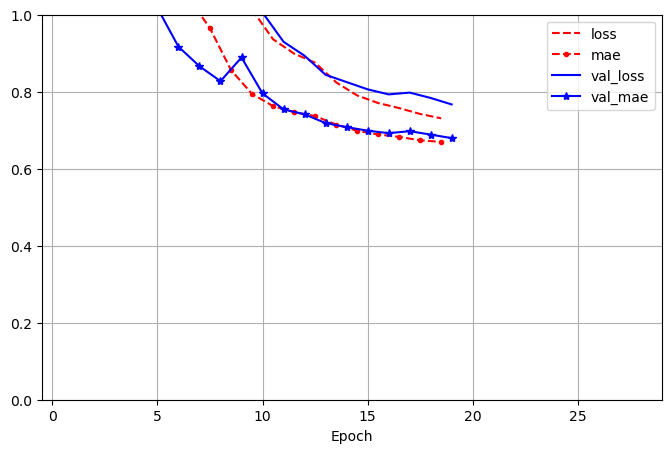

In [59]:
plt.figure(figsize=(8, 5))
for key, style in zip(history.history, ["r--", "r--.", "b-", "b-*"]):
    epochs = np.array(history.epoch) + (0 if key.startswith("val_") else -0.5)
    plt.plot(epochs, history.history[key], style, label=key)
plt.xlabel("Epoch")
plt.axis([-0.5, 29, 0., 1])
plt.legend(loc="upper right")
plt.grid()
plt.show()

In [60]:
mse_test, rmse_test = model.evaluate(X_test, y_test)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - loss: 0.7492 - mae: 0.6998


In [61]:
resultados = model.evaluate(X_test, y_test)
print("Resultados no conjunto de teste:", resultados)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.7492 - mae: 0.6998
Resultados no conjunto de teste: [0.8077583312988281, 0.7012894749641418]


In [62]:
test_loss, test_mae = model.evaluate(X_test, y_test)
print("Test Loss (MSE):", test_loss)
print("Test MAE:", test_mae)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 668us/step - loss: 0.7492 - mae: 0.6998
Test Loss (MSE): 0.8077583312988281
Test MAE: 0.7012894749641418


In [63]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
# Obter previsões
y_pred = model.predict(X_test)

# Calcular métricas
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
MAE: 0.7013
MSE: 0.8078
RMSE: 0.8988
R²: -0.0074


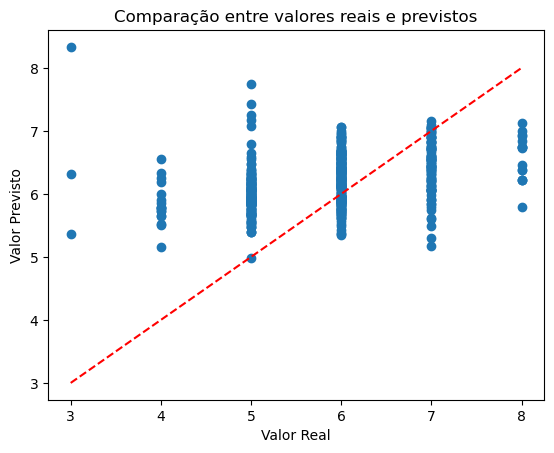

In [64]:
plt.scatter(y_test, y_pred)
plt.xlabel("Valor Real")
plt.ylabel("Valor Previsto")
plt.title("Comparação entre valores reais e previstos")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # linha de identidade
plt.show()

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 547us/step


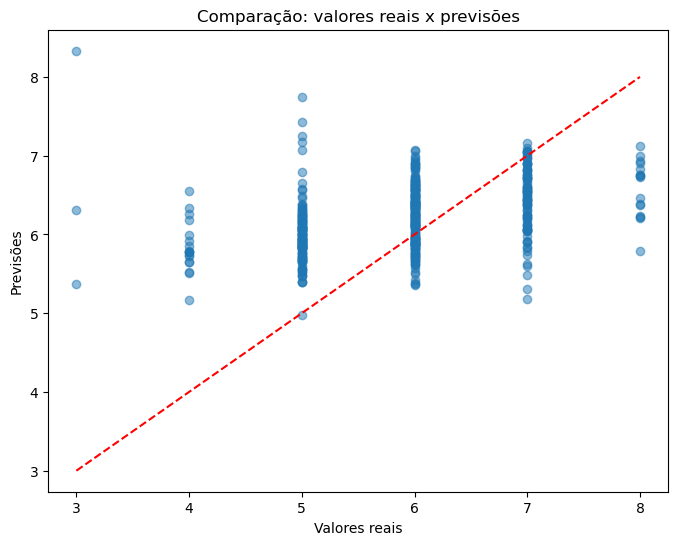

In [65]:
y_pred = model.predict(X_test)

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel("Valores reais")
plt.ylabel("Previsões")
plt.title("Comparação: valores reais x previsões")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], "r--")  # linha ideal
plt.show()

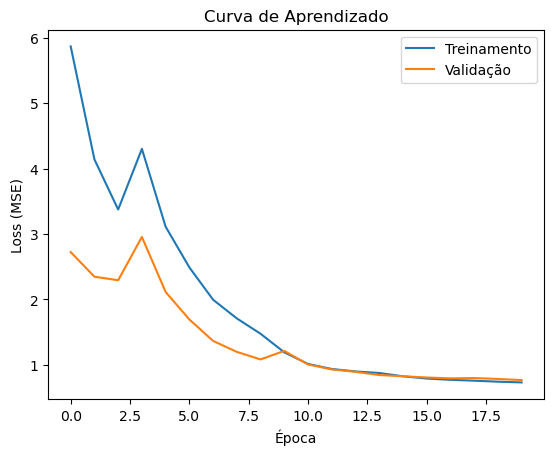

In [66]:
import matplotlib.pyplot as plt

# Plotando a perda (loss) do treinamento e validação
plt.plot(history.history['loss'], label='Treinamento')
plt.plot(history.history['val_loss'], label='Validação')
plt.xlabel('Época')
plt.ylabel('Loss (MSE)')
plt.title('Curva de Aprendizado')
plt.legend()
plt.show()

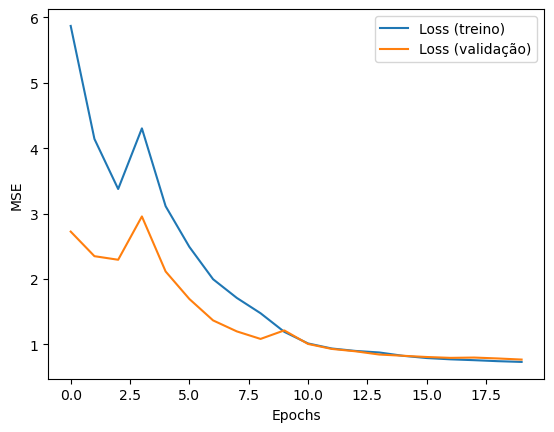

In [67]:
plt.plot(history.history["loss"], label="Loss (treino)")
plt.plot(history.history["val_loss"], label="Loss (validação)")
plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.legend()
plt.show()

In [ ]:
y_pred.astype()

array([[6.586436 ],
       [6.998156 ],
       [6.7487755],
       [6.2050624],
       [6.7667317],
       [6.569739 ],
       [6.241176 ],
       [5.852698 ],
       [5.766948 ],
       [5.952391 ],
       [6.5997233],
       [5.557309 ],
       [6.537602 ],
       [6.080922 ],
       [7.424701 ],
       [5.9995456],
       [6.9108043],
       [5.6819835],
       [6.5489254],
       [5.8068237],
       [5.869778 ],
       [6.1234508],
       [6.2293177],
       [6.098704 ],
       [6.2133527],
       [5.989112 ],
       [5.822086 ],
       [6.496338 ],
       [5.739756 ],
       [6.019329 ],
       [6.068306 ],
       [6.212292 ],
       [6.8411975],
       [5.619511 ],
       [5.7408857],
       [6.816986 ],
       [6.2496233],
       [6.3455887],
       [5.6569943],
       [5.8133254],
       [5.828901 ],
       [6.0580406],
       [6.40194  ],
       [5.615807 ],
       [5.775333 ],
       [6.214358 ],
       [5.728437 ],
       [6.2863927],
       [5.835131 ],
       [6.2557836],


In [82]:
from sklearn.metrics import confusion_matrix
labels = sorted(sample_red["quality"].unique())
cm = confusion_matrix(y_test, np.round(y_pred).astype(int), labels = labels)
print(cm)
print(labels)

[[  0   0   1   1   0   1]
 [  0   0   1  16   1   0]
 [  0   0   7 128   8   1]
 [  0   0   5 157  53   0]
 [  0   0   3  46  45   0]
 [  0   0   0   7   9   0]]
[np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8)]


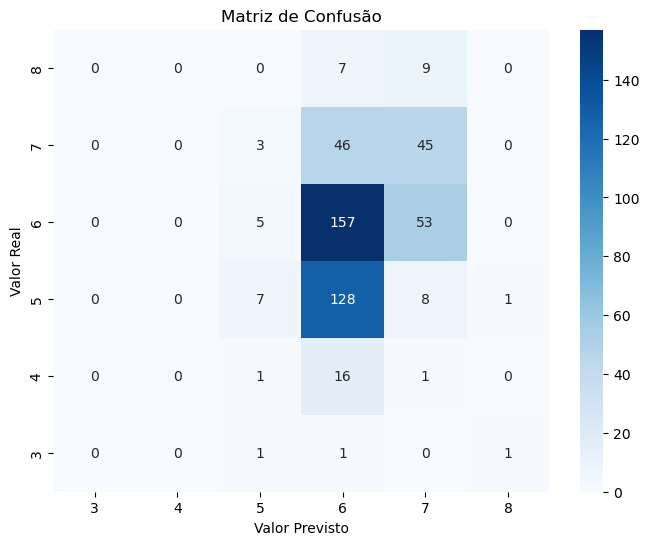

In [83]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax,  xticklabels=labels, yticklabels=labels)
ax.set_xlabel("Valor Previsto")
ax.set_ylabel("Valor Real")
ax.set_title("Matriz de Confusão")
ax.invert_yaxis()
plt.show()